# Step 1: Import helpful libraries

In [ ]:
# firstly, we install package and extensions
#!pip install lux-api
#!jupyter nbextension install --py luxwidget
#!jupyter nbextension enable --py luxwidget

In [2]:
# Familiar imports
import numpy as np
import pandas as pd

# For ordinal encoding categorical variables, splitting data
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split

# For training random forest model
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

import matplotlib.pyplot as plt #to plot some parameters in seaborn
import warnings
warnings.filterwarnings('ignore')


# Step 2: Load the data

Next, we'll load the training and test data.

We set index_col=0 in the code cell below to use the id column to index the DataFrame. (If you're not sure how this works, try temporarily removing index_col=0 and see how it changes the result.)


In [3]:
# import lux
# Load the training data
train = pd.read_csv("../input/30-days-of-ml/train.csv")
test = pd.read_csv("../input/30-days-of-ml/test.csv")

# Preview the data
train.head()

,id,cat0,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,...,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,target
0,1,B,B,B,C,B,B,A,E,C,...,0.400361,0.160266,0.310921,0.389470,0.267559,0.237281,0.377873,0.322401,0.869850,8.113634
1,2,B,B,A,A,B,D,A,F,A,...,0.533087,0.558922,0.516294,0.594928,0.341439,0.906013,0.921701,0.261975,0.465083,8.481233
2,3,A,A,A,C,B,D,A,D,A,...,0.650609,0.375348,0.902567,0.555205,0.843531,0.748809,0.620126,0.541474,0.763846,8.364351
3,4,B,B,A,C,B,D,A,E,C,...,0.668980,0.239061,0.732948,0.679618,0.574844,0.346010,0.714610,0.540150,0.280682,8.049253
4,6,A,A,A,C,B,D,A,E,A,...,0.686964,0.420667,0.648182,0.684501,0.956692,1.000773,0.776742,0.625849,0.250823,7.972260


In [ ]:
#train.save_as_html('eda.html')

# Explore the  data
- Null Data
- Categorical data 
- Is there Text data 
- wich columns will we use 
- IS there outliers that can destory our algo 
- IS there diffrent range  of data 

# Null

In [4]:
train.isnull().sum().values

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0])

In [5]:
train.describe()

,id,cont0,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,target
count,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000
mean,250018.576947,0.527335,0.460926,0.490498,0.496689,0.491654,0.510526,0.467476,0.537119,0.498456,0.474872,0.474492,0.473216,0.494561,0.508273,8.241979
std,144450.150010,0.230599,0.214003,0.253346,0.219199,0.240074,0.228232,0.210331,0.218140,0.239920,0.218007,0.255949,0.222022,0.247292,0.222950,0.746555
min,1.000000,-0.118039,-0.069309,-0.056104,0.130676,0.255908,0.045915,-0.224689,0.203763,-0.260275,0.117896,0.048732,0.052608,-0.074208,0.151050,0.140329
25%,124772.500000,0.405965,0.310494,0.300604,0.329783,0.284188,0.354141,0.342873,0.355825,0.332486,0.306874,0.276017,0.308151,0.289074,0.300669,7.742071
50%,250002.500000,0.497053,0.427903,0.502462,0.465026,0.390470,0.488865,0.429383,0.504661,0.439151,0.434620,0.459975,0.433812,0.422887,0.472400,8.191373
75%,375226.500000,0.668060,0.615113,0.647512,0.664451,0.696599,0.669625,0.573383,0.703441,0.606056,0.614333,0.691579,0.642057,0.714502,0.758447,8.728634
max,499999.000000,1.058443,0.887253,1.034704,1.039560,1.055424,1.067649,1.111552,1.032837,1.040229,0.982922,1.055960,1.071444,0.975035,0.905992,10.411992


In [ ]:
# Check the structure of the data
print(train.info())

# Distribution of Target

In [ ]:
n, bins, patches = plt.hist(x=train['target'], bins='auto', color='blue',alpha=0.7, rwidth=0.5)
plt.xlabel("Loan Amount")
plt.show()

In [ ]:
#Looking unique values
l=dict(train.nunique())
print(l)

# Crosstab

In [ ]:
import seaborn as sns 
red = sns.light_palette("red", as_cmap=True)
cross_tab=pd.crosstab(train['cat0'], train['cat1'], margins = True)
H=cross_tab/cross_tab.loc["All"] # Divide by column totals
H.style.background_gradient(cmap=red)

In [ ]:
# Create a cross table of the loan intent and loan status
t1=pd.crosstab(train['cat0'], train['cat2'], margins = True)
H=t1/t1.loc["All"] # Divide by column totals
H.style.background_gradient(cmap=red)

In [ ]:
t2=pd.crosstab(train['cat0'], train['cat1'],values=train['target'], aggfunc='mean')
#H=cross_tab/cross_tab.loc["All"] # Divide by column totals
t2.style.background_gradient(cmap=red)

# Box_plot


In [ ]:
train.boxplot(column = ['target'], by = 'cat0')
plt.title('Average Percent capital  by Loan Status')
plt.suptitle('')
plt.show()

In [ ]:
train['target'].describe()

# Correlation

<AxesSubplot:>

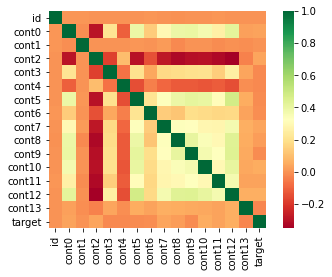

In [7]:
import seaborn as sns 
warnings.filterwarnings("ignore")
sns.heatmap(train.corr(), square=True, cmap='RdYlGn')

#  Working with data types

In [8]:
train.dtypes

id          int64
cat0       object
cat1       object
cat2       object
cat3       object
cat4       object
cat5       object
cat6       object
cat7       object
cat8       object
cat9       object
cont0     float64
cont1     float64
cont2     float64
cont3     float64
cont4     float64
cont5     float64
cont6     float64
cont7     float64
cont8     float64
cont9     float64
cont10    float64
cont11    float64
cont12    float64
cont13    float64
target    float64
dtype: object

# Cat Features 

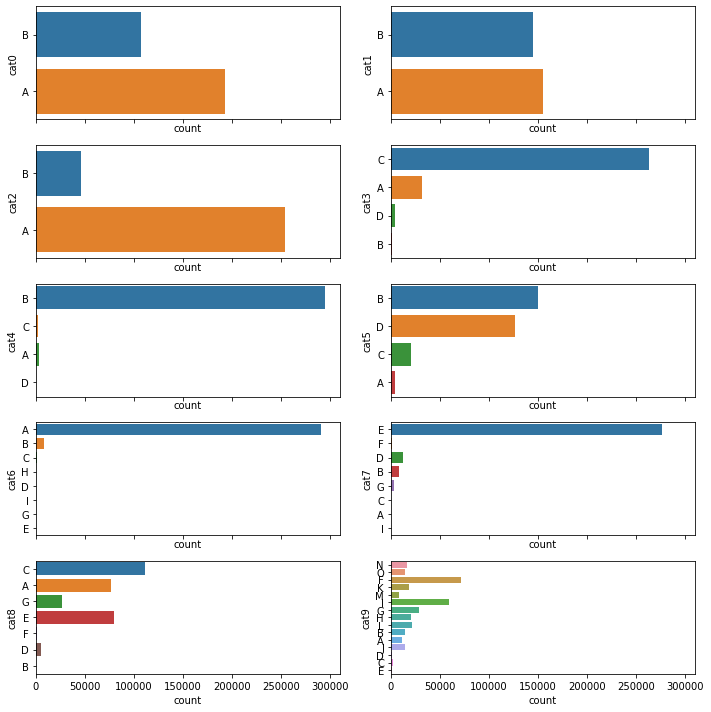

In [9]:
import matplotlib.pyplot as plt
# select the cat columns
cat_columns = train.select_dtypes(exclude=['int64','float64']).columns
# Create a histogram
# create distplots

    
fig, axes =plt.subplots(5,2, figsize=(10,10), sharex=True)
axes = axes.flatten()

for ax, catplot in zip(axes, cat_columns):
    sns.countplot(y=catplot, data=train, ax=ax)

plt.tight_layout()  
plt.show()

# Num Features

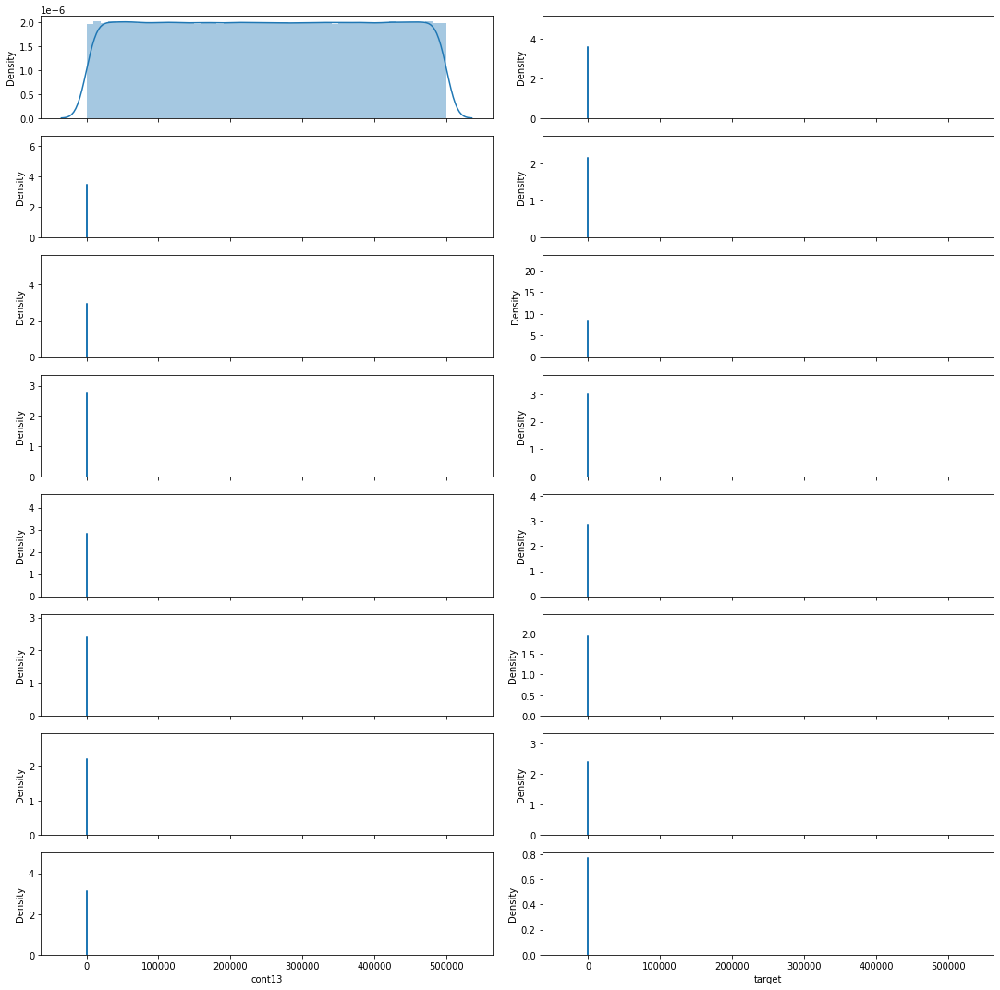

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns 
# select the float columns
num_columns = train.select_dtypes(include=['int64','float64']).columns
# Create a histogram
# create distplots

    
fig, axes =plt.subplots(8,2, figsize=(15,15), sharex=True)
axes = axes.flatten()

for ax, numplot in zip(axes, num_columns):
     sns.distplot(train[numplot],ax=ax,kde=True)

plt.tight_layout()  
plt.show()

In [11]:
train.var()

id        2.086585e+10
cont0     5.317604e-02
cont1     4.579712e-02
cont2     6.418408e-02
cont3     4.804816e-02
cont4     5.763568e-02
cont5     5.208968e-02
cont6     4.423930e-02
cont7     4.758504e-02
cont8     5.756147e-02
cont9     4.752724e-02
cont10    6.551013e-02
cont11    4.929360e-02
cont12    6.115316e-02
cont13    4.970668e-02
target    5.573441e-01
dtype: float64

# boxplot:


<AxesSubplot:xlabel='variable', ylabel='value'>

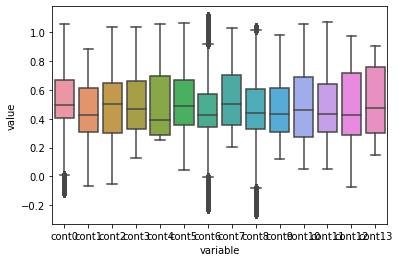

In [12]:
X_num = train.select_dtypes(include=['int64','float64']).drop(['id','target'], axis=1)
sns.boxplot(data=X_num.melt(value_vars=X_num.columns),
            x='variable', y='value')

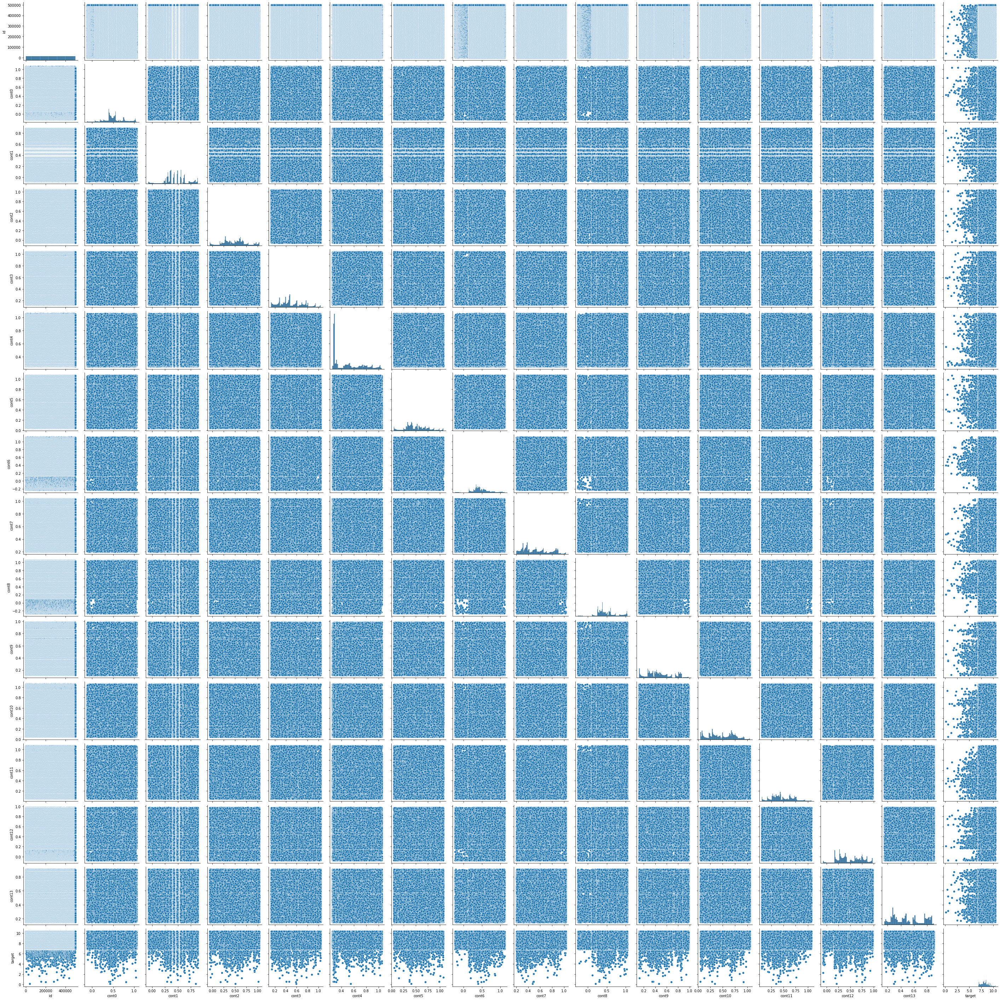

In [13]:
import seaborn as sns 
warnings.filterwarnings("ignore")

sns.pairplot(train)

# Scaling data for num feature comparison

In [14]:
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor()
#### Create the encoder.
# Create arrays for the features and the response variable
y = train['target'].to_numpy()
X = train.select_dtypes(include=['int64','float64']).drop(['id','target'], axis=1).to_numpy()

In [15]:
train.select_dtypes(include=['int64','float64']).drop(['id','target'], axis=1).columns

Index(['cont0', 'cont1', 'cont2', 'cont3', 'cont4', 'cont5', 'cont6', 'cont7',
       'cont8', 'cont9', 'cont10', 'cont11', 'cont12', 'cont13'],
      dtype='object')

In [16]:
X.shape

(300000, 14)

# Modeling without normalizing
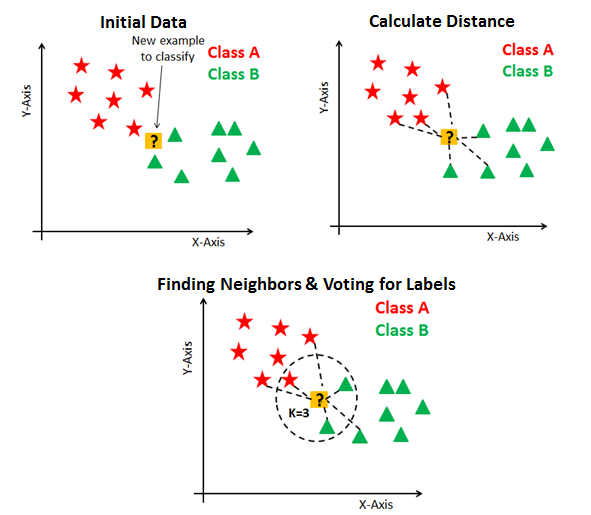

In [17]:
# Split the dataset and labels into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X,y)
# Fit the k-nearest neighbors model to the training data
knn.fit(X_train, y_train)
# Score the model on the test data
print(knn.score(X_test, y_test))

-0.16516098214203723


# KNN on non-scaled data

In [ ]:
# Import StandardScaler from scikit-learn
from sklearn.preprocessing import StandardScaler
# Create the scaling method.
ss = StandardScaler()

# Apply the scaling method to the dataset used for modeling.
X_scaled =ss.fit_transform(X) 
X_train, X_test, y_train, y_test = train_test_split(X_scaled,y)

# Fit the k-nearest neighbors model to the training data
knn.fit(X_train, y_train)

# Score the model on the test data
print(knn.score(X_test, y_test))

# Hyper param tuning

In [ ]:
#knn_r_acc = []
#for i in range(1,5,1):
 #   knn = KNeighborsRegressor(n_neighbors=i)
  #  knn.fit(X_train,y_train)   
   # test_score = knn.score(X_test,y_test)
    #train_score = knn.score(X_train,y_train)  
   # knn_r_acc.append((i, test_score ,train_score))
    
    #df = pd.DataFrame(knn_r_acc, columns=['K','Test Score','Train Score'])
#print(df)

# Evaluate model :


In [ ]:
knn_without_cat = KNeighborsRegressor(n_neighbors=2)
knn_without_cat.fit(X_train,y_train)
preds_valid = knn_without_cat.predict(X_test)
print(mean_squared_error(y_test, preds_valid, squared=False))

# Train on all data 

In [ ]:
y = train['target'].to_numpy()
X = train.select_dtypes(include=['int64','float64']).drop(['id','target'], axis=1).to_numpy()
knn_without_cat_final  = KNeighborsRegressor(n_neighbors=2)
X_final_scaled =ss.fit_transform(X) 
knn_without_cat_final.fit(X_final_scaled,y)

#  Submit to the competition
We'll begin by using the trained model to generate predictions, which we'll save to a CSV file.


In [ ]:
test_num= test.select_dtypes(include=['int64','float64']).drop(['id'], axis=1).to_numpy()
# Use the model to generate predictions
test_num_scaled =ss.fit_transform(test_num) 
predictions = knn_without_cat_final.predict(test_num_scaled)

# Save the predictions to a CSV file
output = pd.DataFrame({'Id': test.id,
                       'target': predictions})
output.to_csv('submission1.csv', index=False)

# Feature engineering

##  What is feature engineering?

Feature engineering is the creation of new features based on existing features, and it adds information to your dataset that is useful in some way: it adds features useful for your prediction or clustering task, or it sheds insight into relationships between features. Real world data is often not neat and tidy, and in addition to preprocessing steps like standardization, you'll likely have to extract and expand information that exists in the columns in your dataset. Feature engineering is a subject that could definitely be given its own entire course, so we're just going to go over some basics

# To be contiuned next notebook  to add add cat features 

#  Encoding categorical variables - one-hot/Label encoder 

# Import LabelEncoder
from sklearn import preprocessing
#creating labelEncoder
le = preprocessing.LabelEncoder()
# Converting string labels into numbers.
# List of categorical columns
cat_columns = train.select_dtypes(exclude=['int64','float64']).columns

# ordinal-encode categorical columns
#X = features.copy()
#X_test = test.copy()
# ordinal_encoder = OrdinalEncoder()
X[object_cols] = le.fit_transform(features[object_cols])
X_test[object_cols] = ordinal_encoder.transform(test[object_cols])

# Preview the ordinal-encoded features
X.head()